<a href="https://colab.research.google.com/github/Frankl1sales/PDI_UFPEL_fork/blob/main/aulaCorVersion2_Trabalho.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Feito por Franklin Sales de Oliveira

## Extração da Imagem

Foi extraído a imagem do pdf:
https://www.extractpdf.com/

Foi usado o https://www.rapidtables.com/web/color/RGB_Color.html para melhor separação das cores através do limiar

## RGB

In [1]:
# Importing modules
import skimage.io as io
import matplotlib.pyplot as plt
import numpy as np
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte

Linhas: 710 Colunas: 963


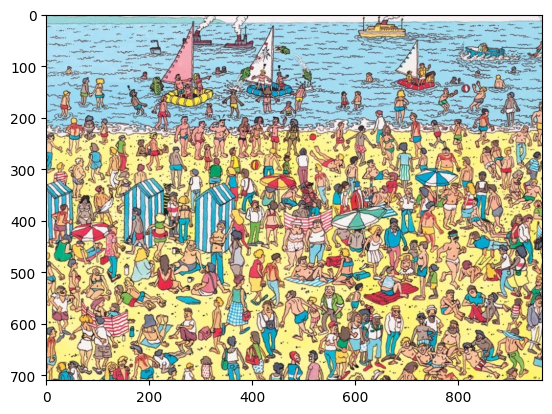

In [2]:
# Reading image using imread
image_RGB_color=io.imread('/content/Trabalho_Pratico_COR-000.jpg')
image_gray=rgb2gray(image_RGB_color)

linha,coluna=image_gray.shape

print('Linhas:',linha,'Colunas:',coluna)


plt.imshow(image_RGB_color)
plt.show()

In [3]:

image_RGB_GRAY=image_RGB_color.copy()

image_RGB_GRAY[:,:,0]=img_as_ubyte(image_gray)
image_RGB_GRAY[:,:,1]=img_as_ubyte(image_gray)
image_RGB_GRAY[:,:,2]=img_as_ubyte(image_gray)

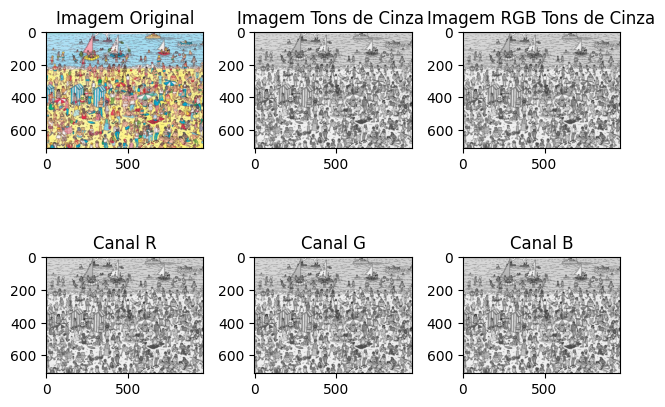

In [4]:
fig, axes = plt.subplots(2,3)

axes[0][0].imshow(image_RGB_color)
axes[0][0].set_title("Imagem Original")

axes[0][1].imshow(image_gray, cmap=plt.cm.gray)
axes[0][1].set_title("Imagem Tons de Cinza ")

axes[0][2].imshow(image_RGB_GRAY, cmap=plt.cm.gray)
axes[0][2].set_title("Imagem RGB Tons de Cinza")

axes[1][0].imshow(image_RGB_GRAY[:,:,0], cmap=plt.cm.gray)
axes[1][0].set_title("Canal R")

axes[1][1].imshow(image_RGB_GRAY[:,:,1], cmap=plt.cm.gray)
axes[1][1].set_title("Canal G")


axes[1][2].imshow(image_RGB_GRAY[:,:,2], cmap=plt.cm.gray)
axes[1][2].set_title("Canal B")

fig.tight_layout()
plt.show()

In [11]:
plt.close(fig) # para reiniciar o matplot

for i in range(linha):
	for j in range(coluna):
		if image_RGB_color[i,j,0] > 100: #canal R
			if image_RGB_color[i,j,1] > 50 and image_RGB_color[i,j,1] < 100: #canal G
				if image_RGB_color[i,j,1] > 50 and image_RGB_color[i,j,1] < 100: #canal B
					image_RGB_GRAY[i,j,:]=image_RGB_color[i,j,:].copy()

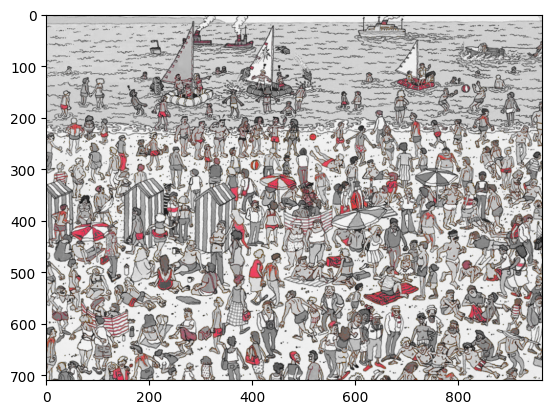

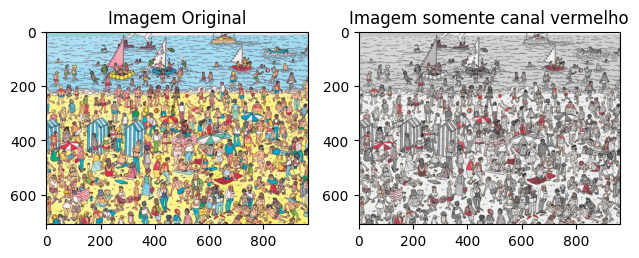

In [12]:
plt.imshow(image_RGB_GRAY)
plt.show()


fig, axes = plt.subplots(1,2)

axes[0].imshow(image_RGB_color)
axes[0].set_title("Imagem Original")


axes[1].imshow(image_RGB_GRAY)
axes[1].set_title("Imagem somente canal vermelho")

fig.tight_layout()
plt.show()

In [5]:
plt.close('all') # para reiniciar o matplot

limiar_verde_min = 50   # Verde mínimo para ser considerado
limiar_razao = 1.0     # G deve ser 1.5x maior que R e B

for i in range(linha):
    for j in range(coluna):
        R, G, B = image_RGB_color[i,j]

        if (G > limiar_verde_min and           # Verde não muito escuro
            G > R * limiar_razao and           # Verde >> Vermelho
            G > B * limiar_razao):             # Verde >> Azul
            image_RGB_GRAY[i,j] = image_RGB_color[i,j]


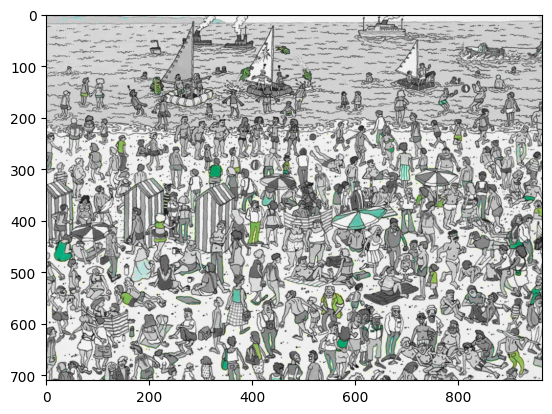

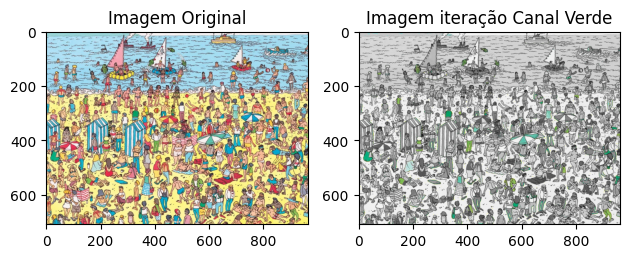

In [6]:
plt.imshow(image_RGB_GRAY)
plt.show()


fig, axes = plt.subplots(1,2)

axes[0].imshow(image_RGB_color)
axes[0].set_title("Imagem Original")


axes[1].imshow(image_RGB_GRAY)
axes[1].set_title("Imagem iteração Canal Verde")

fig.tight_layout()
# Salva a figura (ANTES do plt.show()!)
plt.savefig("verdeUFPEL.png", dpi=300, bbox_inches='tight')  # ou .jpg, .pdf, etc.
plt.show()

In [ ]:
limiar_verde_min = 50   # Verde mínimo para ser considerado
limiar_razao = 1.0     # G deve ser 1.5x maior que R e B

for i in range(linha):
    for j in range(coluna):
        R, G, B = image_RGB_color[i,j]

        if (B > limiar_verde_min and           # Verde não muito escuro
            B > R * limiar_razao and           # Verde >> Vermelho
            B > G * limiar_razao):             # Verde >> Azul
            image_RGB_GRAY[i,j] = image_RGB_color[i,j]


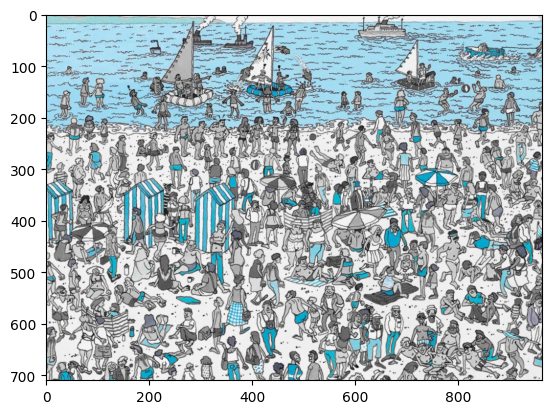

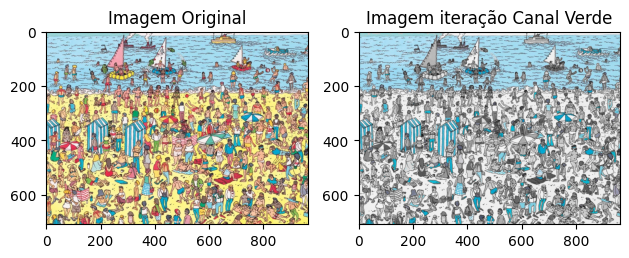

In [ ]:
plt.imshow(image_RGB_GRAY)
plt.show()


fig, axes = plt.subplots(1,2)

axes[0].imshow(image_RGB_color)
axes[0].set_title("Imagem Original")


axes[1].imshow(image_RGB_GRAY)
axes[1].set_title("Imagem iteração Canal Verde")

fig.tight_layout()
# Salva a figura (ANTES do plt.show()!)
#plt.savefig("verdeUFPEL.png", dpi=300, bbox_inches='tight')  # ou .jpg, .pdf, etc.
plt.show()

## HSV


Linhas: 710 Colunas: 963


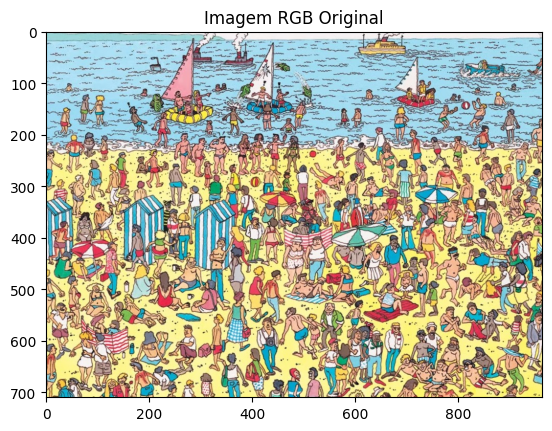

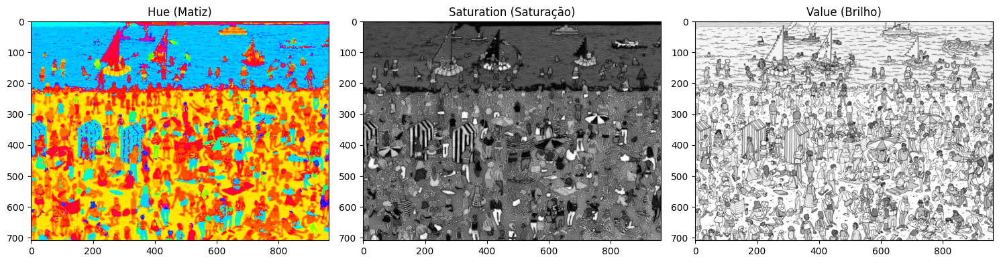

In [8]:
import matplotlib.pyplot as plt
from skimage import io
from skimage.color import rgb2hsv, rgb2gray

# Carrega a imagem RGB
image_RGB_color = io.imread('/content/Trabalho_Pratico_COR-000.jpg')

# Converte RGB para HSV
image_HSV = rgb2hsv(image_RGB_color)  # Formato: (H, S, V), com valores H [0,1], S [0,1], V [0,1]

# Converte RGB para escala de cinza (opcional, se ainda necessário)
image_gray = rgb2gray(image_RGB_color)

linha, coluna = image_gray.shape
print('Linhas:', linha, 'Colunas:', coluna)

# Mostra a imagem original RGB
plt.imshow(image_RGB_color)
plt.title("Imagem RGB Original")
plt.show()

# Mostra os canais HSV separadamente
fig, axes = plt.subplots(1, 3, figsize=(15, 5))
axes[0].imshow(image_HSV[:, :, 0], cmap='hsv')  # Canal Hue (Matiz)
axes[0].set_title("Hue (Matiz)")
axes[1].imshow(image_HSV[:, :, 1], cmap='gray')  # Canal Saturation (Saturação)
axes[1].set_title("Saturation (Saturação)")
axes[2].imshow(image_HSV[:, :, 2], cmap='gray')  # Canal Value (Brilho)
axes[2].set_title("Value (Brilho)")
plt.tight_layout()
plt.show()


### HSV Vermelho

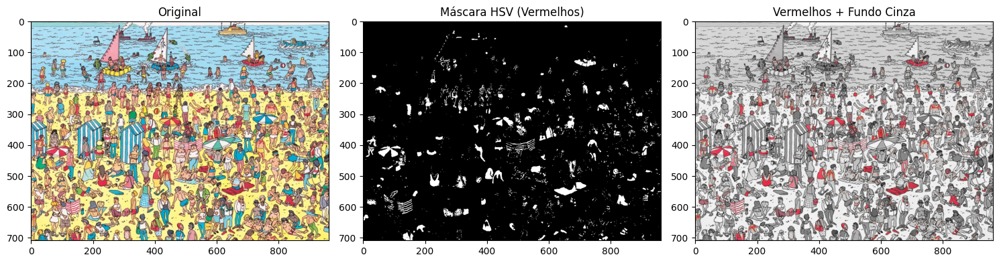

In [10]:
import matplotlib.pyplot as plt
from skimage import io, color
import numpy as np

# 1. Carregar imagem e converter para HSV e escala de cinza
image_RGB_color = io.imread('/content/Trabalho_Pratico_COR-000.jpg')
image_HSV = color.rgb2hsv(image_RGB_color)
image_gray = color.rgb2gray(image_RGB_color)  # Converter para escala de cinza [0, 1]

# 2. Definir limiares HSV para tons de vermelho (duas faixas)
# Hue vai de 0 a 1 em skimage (0.0 e 1.0 ~ vermelho)
hue_min1, hue_max1 = 0.0, 0.05   # Vermelho "inicial"
hue_min2, hue_max2 = 0.95, 1.0   # Vermelho "final"
saturation_min = 0.4
value_min = 0.3

# 3. Criar máscara booleana para tons de vermelho
mask = (
    (
        (image_HSV[:, :, 0] >= hue_min1) &
        (image_HSV[:, :, 0] <= hue_max1)
    ) | (
        (image_HSV[:, :, 0] >= hue_min2) &
        (image_HSV[:, :, 0] <= hue_max2)
    )
) & (
    (image_HSV[:, :, 1] >= saturation_min) &
    (image_HSV[:, :, 2] >= value_min)
)

# 4. Criar imagem resultante: vermelho preservado, o resto em cinza
image_result = np.zeros_like(image_RGB_color)

# Mantém pixels vermelhos
image_result[mask] = image_RGB_color[mask]

# Preenche o restante com tons de cinza
gray_rgb = (image_gray * 255)[:, :, np.newaxis]  # (H, W, 1)
image_result[~mask] = np.repeat(gray_rgb[~mask], 3, axis=1)  # (H, W, 3)

# 5. Mostrar resultados
plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(image_RGB_color), plt.title("Original")
plt.subplot(132), plt.imshow(mask, cmap='gray'), plt.title("Máscara HSV (Vermelhos)")
plt.subplot(133), plt.imshow(image_result.astype(np.uint8)), plt.title("Vermelhos + Fundo Cinza")
plt.tight_layout()
plt.show()


### HSV Verde

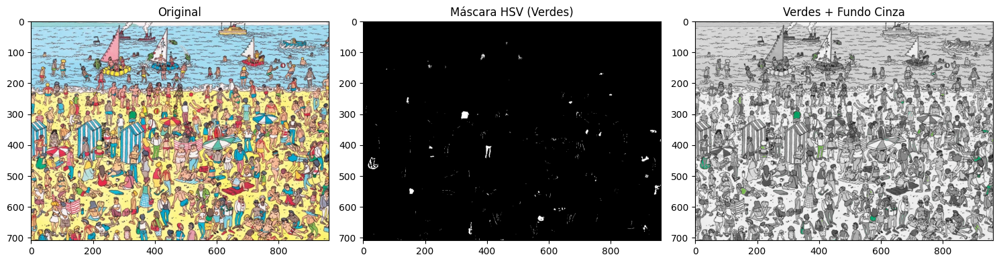

In [9]:
import matplotlib.pyplot as plt
from skimage import io, color
import numpy as np

# 1. Carregar imagem e converter para HSV e escala de cinza
image_RGB_color = io.imread('/content/Trabalho_Pratico_COR-000.jpg')
image_HSV = color.rgb2hsv(image_RGB_color)
image_gray = color.rgb2gray(image_RGB_color)  # Converter para escala de cinza [0, 1]

# 2. Definir limiares HSV para verdes
hue_min, hue_max = 0.25, 0.45  # Faixa de matiz para verde
saturation_min = 0.4  # Saturação mínima
value_min = 0.3  # Brilho mínimo

# 3. Criar máscara booleana (CORRIGIDO - parênteses fechados corretamente)
mask = (
    (image_HSV[:, :, 0] >= hue_min) &
    (image_HSV[:, :, 0] <= hue_max) &
    (image_HSV[:, :, 1] >= saturation_min) &
    (image_HSV[:, :, 2] >= value_min)
)

# 4. Criar imagem resultante:
#    - Pixels verdes mantêm cor original
#    - Outros pixels são convertidos para cinza
image_result = np.zeros_like(image_RGB_color)

# Versão otimizada (sem loop for)
image_result[mask] = image_RGB_color[mask]  # Mantém verdes
gray_rgb = (image_gray * 255)[:, :, np.newaxis]  # Converte cinza para 3 canais
image_result[~mask] = np.repeat(gray_rgb[~mask], 3, axis=1)  # Preenche não-verdes com cinza

# 5. Mostrar resultados
plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(image_RGB_color), plt.title("Original")
plt.subplot(132), plt.imshow(mask, cmap='gray'), plt.title("Máscara HSV (Verdes)")
plt.subplot(133), plt.imshow(image_result), plt.title("Verdes + Fundo Cinza")
plt.tight_layout()
plt.show()



### HSV Azul

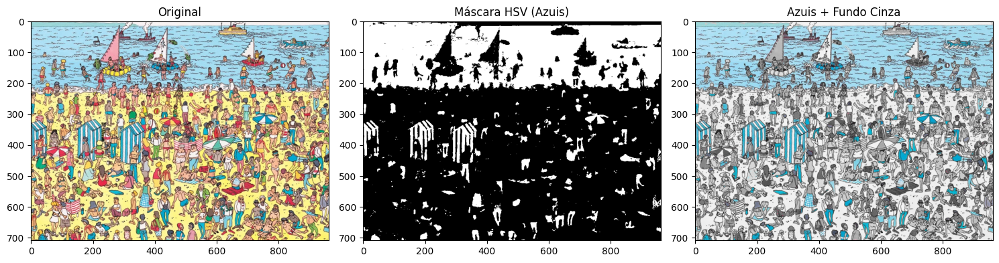

In [5]:
import matplotlib.pyplot as plt
from skimage import io, color
import numpy as np

# 1. Carregar imagem e converter para HSV e escala de cinza
image_RGB_color = io.imread('/content/Trabalho_Pratico_COR-000.jpg')
image_HSV = color.rgb2hsv(image_RGB_color)
image_gray = color.rgb2gray(image_RGB_color)  # Converter para escala de cinza [0, 1]

# 2. Definir limiares HSV para tons de azul
hue_min, hue_max = 0.50, 0.95  # Faixa de matiz para azul
saturation_min = 0.1
value_min = 0.2

# 3. Criar máscara booleana para tons de azul
mask = (
    (image_HSV[:, :, 0] >= hue_min) &
    (image_HSV[:, :, 0] <= hue_max) &
    (image_HSV[:, :, 1] >= saturation_min) &
    (image_HSV[:, :, 2] >= value_min)
)

# 4. Criar imagem resultante: azul preservado, o resto em cinza
image_result = np.zeros_like(image_RGB_color)

# Mantém pixels azuis
image_result[mask] = image_RGB_color[mask]

# Preenche o restante com tons de cinza
gray_rgb = (image_gray * 255)[:, :, np.newaxis]  # (H, W, 1)
image_result[~mask] = np.repeat(gray_rgb[~mask], 3, axis=1)  # (H, W, 3)

# 5. Mostrar resultados
plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(image_RGB_color), plt.title("Original")
plt.subplot(132), plt.imshow(mask, cmap='gray'), plt.title("Máscara HSV (Azuis)")
plt.subplot(133), plt.imshow(image_result.astype(np.uint8)), plt.title("Azuis + Fundo Cinza")
plt.tight_layout()
plt.show()


## L.a.b

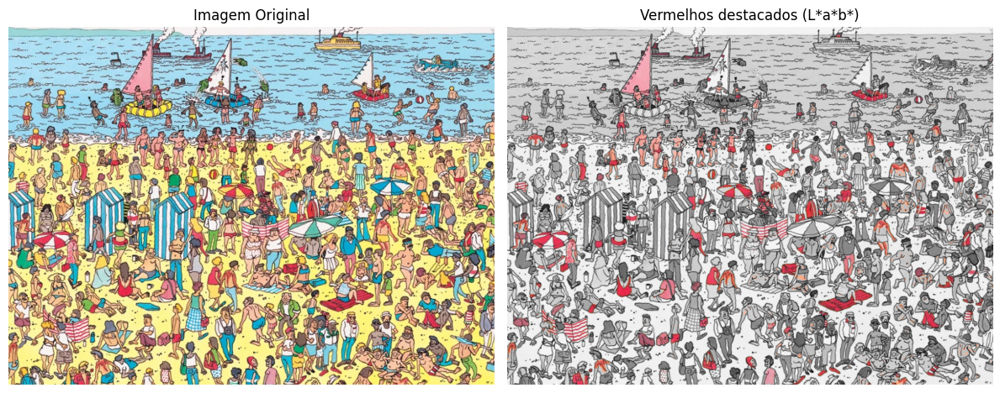

In [12]:
from skimage import io, color, img_as_float
import numpy as np
import matplotlib.pyplot as plt

# Carrega a imagem e converte para float
image_RGB_color = img_as_float(io.imread("/content/Trabalho_Pratico_COR-000.jpg"))

# Converte RGB para L*a*b*
image_LAB = color.rgb2lab(image_RGB_color)

# Máscara para tons de vermelho (a* bem positivo)
limiar_a = 20    # Quanto maior, mais vermelho
# opcional: filtrar b* também para tons mais magenta/vermelho escuro
mascara_vermelho = (image_LAB[:, :, 1] > limiar_a)

# Converte imagem para tons de cinza e reconstrói RGB
image_gray = color.rgb2gray(image_RGB_color)
image_gray_rgb = np.stack([image_gray]*3, axis=-1)

# Cria imagem final com apenas os vermelhos em cor
image_destacada = image_gray_rgb.copy()
image_destacada[mascara_vermelho] = image_RGB_color[mascara_vermelho]

# Exibição
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image_RGB_color)
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(image_destacada)
axes[1].set_title("Vermelhos destacados (L*a*b*)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


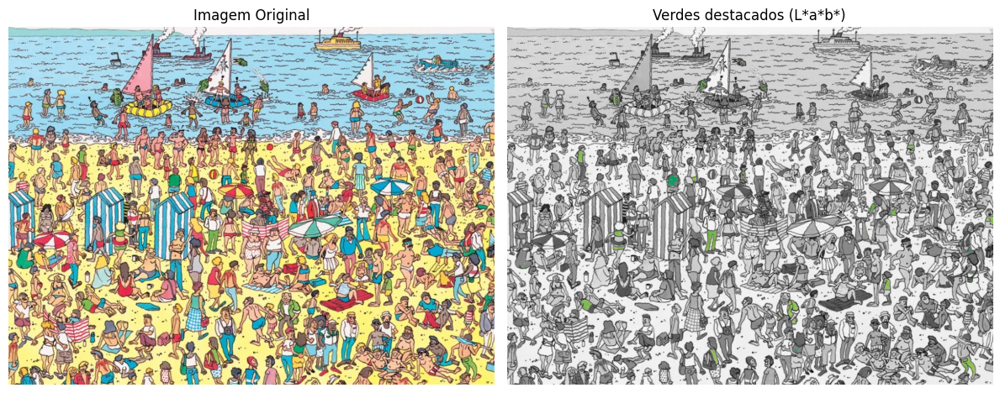

In [15]:
from skimage import io, color, img_as_float
import numpy as np
import matplotlib.pyplot as plt

# Carrega a imagem RGB e converte para float (0.0 a 1.0)
image_RGB_color = img_as_float(io.imread("/content/Trabalho_Pratico_COR-000.jpg"))
linha, coluna, _ = image_RGB_color.shape

# Converte a imagem RGB para L*a*b*
image_LAB = color.rgb2lab(image_RGB_color)

# Define limiares estritos para verde
limiar_a = -20    # Verde bem forte
limiar_b = 20     # Componente amarelo moderado
mascara_verde = (image_LAB[:, :, 1] < limiar_a) & (image_LAB[:, :, 2] > limiar_b)

# Converte a imagem RGB para escala de cinza
image_gray = color.rgb2gray(image_RGB_color)
image_gray_rgb = np.stack([image_gray]*3, axis=-1)  # converte p/ RGB de novo

# Aplica os verdes originais apenas onde a máscara é verdadeira
image_destacada = image_gray_rgb.copy()
image_destacada[mascara_verde] = image_RGB_color[mascara_verde]

# Exibição
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image_RGB_color)
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(image_destacada)
axes[1].set_title("Verdes destacados (L*a*b*)")
axes[1].axis("off")

plt.tight_layout()
plt.show()


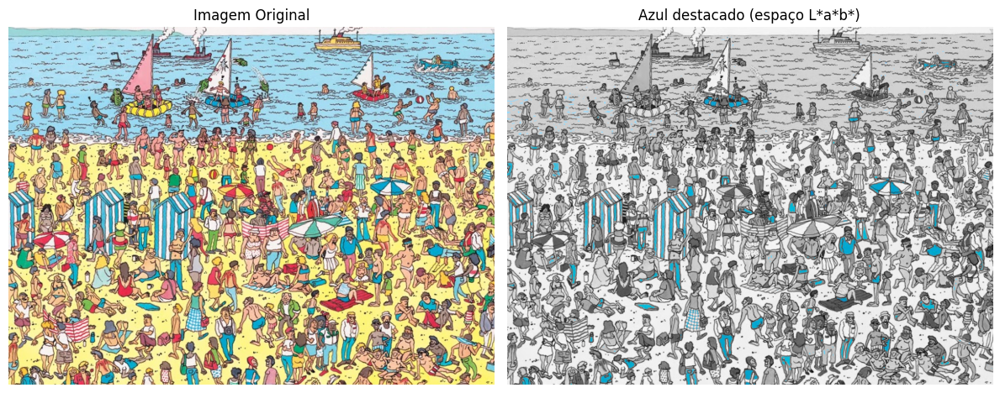

In [16]:
from skimage import io, color, img_as_float
import numpy as np
import matplotlib.pyplot as plt

# Carrega a imagem e converte para float
image_RGB_color = img_as_float(io.imread("/content/Trabalho_Pratico_COR-000.jpg"))

# Converte RGB para L*a*b*
image_LAB = color.rgb2lab(image_RGB_color)

# Máscara para tons de azul (b* negativo forte)
limiar_b = -20  # quanto mais negativo, mais azul
mascara_azul = (image_LAB[:, :, 2] < limiar_b) & (image_LAB[:, :, 1] < 10)  # evita magenta

# Converte imagem para tons de cinza
image_gray = color.rgb2gray(image_RGB_color)
image_gray_rgb = np.stack([image_gray]*3, axis=-1)

# Cria imagem final com apenas os azuis mantidos
image_destacada = image_gray_rgb.copy()
image_destacada[mascara_azul] = image_RGB_color[mascara_azul]

# Exibição
fig, axes = plt.subplots(1, 2, figsize=(12, 6))

axes[0].imshow(image_RGB_color)
axes[0].set_title("Imagem Original")
axes[0].axis("off")

axes[1].imshow(image_destacada)
axes[1].set_title("Azul destacado (espaço L*a*b*)")
axes[1].axis("off")

plt.tight_layout()
plt.show()
